In [ ]:
import numpy as np
import matplotlib
import imageio
from numpy import linalg as LA
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from matplotlib import pyplot as plt
import os
import glob
from pathlib import Path
import scipy.io
import cv2
import pandas as pd
from scipy.spatial.distance import pdist
from scipy.spatial import distance_matrix
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.metrics import f1_score
from sklearn.metrics.cluster import homogeneity_score
from sklearn.cluster import SpectralClustering

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Function that takes image and returns RGB**

---



In [ ]:
def returnrgb(imgvctr):
  r, g, b = cv2.split(imgvctr)
  r = r.flatten()# falttening to make each row a pixel 
  g = g.flatten()
  b = b.flatten()
  #print(r.shape)

  rgb=np.zeros(shape=(np.shape(r)[0],0)) #The matrix will contain every pixel with rgb component, should be used in K-means
  rgb=np.column_stack((rgb,r))
  rgb=np.column_stack((rgb,g))
  rgb=np.column_stack((rgb,b))
  data_pd = pd.DataFrame(rgb,columns=['r','g','b'])
  return rgb

#rgb=returnrgb(imgvctr)
#print(rgb)

K-**means**

In [ ]:
def kmeans(rgb,k):
  
  rgb_rows=np.size(rgb,0)
  rgb_cols=np.size(rgb,1)
  #print(rgb_cols)
  #print(rgb_rows)
  #labels=np.zeros((0,rgb_rows))
  #print(labels.shape)

  kmeans = KMeans(n_clusters=k, random_state=0).fit(rgb)
  label=kmeans.labels_
  label=label.reshape(1,rgb_rows)+1
  #print(labels)
  return label
  
#kmeans(rgb)


N-CUT

In [ ]:
def N_cut(rgb):
  clustering = SpectralClustering(n_clusters=5,random_state=0,affinity='nearest_neighbors',n_neighbors=5).fit(rgb)
  label_ncut=clustering.labels_
  #print(label_ncut.size)
  label2=label_ncut.reshape(100,100)
  #plt.imshow(label2)
  #plt.show()
  return label_ncut

# K-Means - our implementation

In [ ]:
k = 2
#Choose a random point from the graph to be the centroid
centroid = data_pd.sample(n=k)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(data_pd['r'], data_pd['g'], data_pd['b'], marker='^')

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.grid()
plt.show()

print(np.size(rgb,0))
okay = 7
k=[3,5,7,9,11]
#Converting from dataframe to numpy for ease 
centroids = centroid.to_numpy()
#print(centroids)
while okay>5:
   print(okay)
   #Declaring empty matrices for the euclidian 
   euc_dist = np.zeros((np.size(rgb,0),k))
   clusters[]
   cluster1 = np.empty((0,3), float)
   cluster2 = np.empty((0,3), float)
   #Computing Euclidean Distance between each point and all centroids, stored in euc_dist matrix
   
   euc_dist[:,0:1] = distance_matrix(rgb,centroids[0:1,:])
   euc_dist[:,1:2] = distance_matrix(rgb,centroids[1:2,:])
   
   #get the index of the (coloumn) of the shortest distance in each row.
   min = np.argmin(euc_dist,axis=1)
   print(euc_dist)
   print(min)
   #Cluster assignment
   for j in k[0]:
    for i in range(len(min)):
        if min[i] == j:
          row=rgb[i].flatten()
          cluster[j] = np.append(cluster1,[rgb[i]],axis=0)
          
    
        elif min[i] == 1:
          cluster2 = np.append(cluster2, [rgb[i]], axis=0)
   
   
   
   #print("Cluster1:\n",cluster1)
   #print("Cluster2:\n",cluster2)
   
   new_centroid = np.empty((0,3), float)
   mu1 = np.empty((0,3), float)
   mu2 = np.empty((0,3), float)
  
   mu1 = np.append(mu1,cluster1, axis=0)
   mu2 = np.append(mu2,cluster2,axis=0)
   
  
   mu1  = (np.array([np.mean(mu1,axis=0)]))
   mu2  = (np.array([np.mean(mu2,axis=0)]))
   
   new_centroid = np.append(new_centroid,mu1,axis=0)
   new_centroid = np.append(new_centroid,mu2,axis=0)
   #print("New Centroid:\n",new_centroid)
   #print("\nOldCentroid:\n",centroids)
   break
   okay = okay-1
   if np.array_equal(new_centroid,centroids):
     break

   else:
     centroids = new_centroid
    
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(cluster1[:,0:1], cluster1[:,1:2],cluster1[:,2:3], marker='.')
ax.scatter(cluster2[:,0:1], cluster2[:,1:2],cluster2[:,2:3], marker='^')
ax.scatter(centroids[:,0:1], centroids[:,1:2],centroids[:,2:3], marker='p', c='black')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.grid()
plt.show()

In [ ]:
cluster3=cluster2
rows=(np.size(rgb,0))
print(cluster3.shape)
cluster3=cluster2.flatten()
print(cluster3.shape)
#cluster2.reshape(rows,3)
print(cluster3.shape)


In [ ]:
array1 = [1, 2, 3]
array2 = [4, 5, 6]
array3 = [7, 8, 9]
array_tuple = (array1, array2, array3)
arrays = np.vstack(array_tuple)
print(arrays[0])

In [ ]:
print(rgb.shape)
num_rows = np.shape(imgvctr)[0]
num_columns = np.shape(imgvctr)[1]
coordinates=np.zeros((num_columns*num_rows,2))
for i in range(num_rows):
  for j in range(num_columns):
    coordinates[(i*num_columns)+j][0]=i
    coordinates[(i*num_columns)+j][1]=j

print(coordinates)

rgbxy=np.append(coordinates,rgb,axis=1)
print(rgbxy)

In [ ]:
k=[3,5,7,9,11]

for i in k:
  kmeans = KMeans(n_clusters=3, random_state=0).fit(rgbxy)
  label=kmeans.labels_
  u_labels = np.unique(label)
  fig2 = plt.figure()
  ax = Axes3D(fig2)
  for j in u_labels:
    ax.scatter(rgbxy[label == j , 0] , rgbxy[label == j , 1] , rgbxy[label == j,2],label = j)
  plt.title("K=%i"%i)
  plt.show()
  
  if(i==3):
    break

In [ ]:
num_rows = np.shape(imgvctr)[0]
num_columns = np.shape(imgvctr)[1]
print(label.shape)
#print(num_columns)
label2=label
label2=label2.reshape(num_rows,num_columns)
print(label2.shape)
plt.imshow(label2)
plt.show()

Spectral

In [ ]:
from skimage import data, segmentation, color
from skimage.future import graph
from matplotlib import pyplot as plt


img = imgvctr

labels1 = segmentation.slic(img, compactness=30, n_segments=400)
out1 = color.label2rgb(labels1, img, kind='avg', bg_label=0)

g = graph.rag_mean_color(img, labels1, mode='similarity')
labels2 = graph.cut_normalized(labels1, g)
out2 = color.label2rgb(labels2, img, kind='avg', bg_label=0)

fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(6, 8))

ax[0].imshow(out1)
ax[1].imshow(out2)

for a in ax:
    a.axis('off')

plt.tight_layout()

# **Cluster evaluation:**

**3.b** F-measure

In [ ]:
def measure_f(grndtruth, y_predict,k):
  #y_predict=label2.flatten()+1
  fmeasure=f1_score(grndtruth.flatten(),y_predict,average='micro')
  #print(np.unique(grndtruth))
  #print(np.unique(y_predict))
  print("The F-Measure Score for ",k," clusters is:\n",fmeasure)

  Conditional Entropy

In [ ]:
def measure_entropy(grndtruth, y_predict,k):
  #print("G",grndtruth)
  #print("y_pre",y_predict)
  score=1-homogeneity_score(grndtruth,y_predict)
  print("The Conditional Entropy for",k,"clusters score is:\n",score)

# Generate function

NUM=  0.0
NUM=  1.0
NUM=  2.0
NUM=  3.0
NUM=  4.0
NUM=  5.0
NUM=  6.0


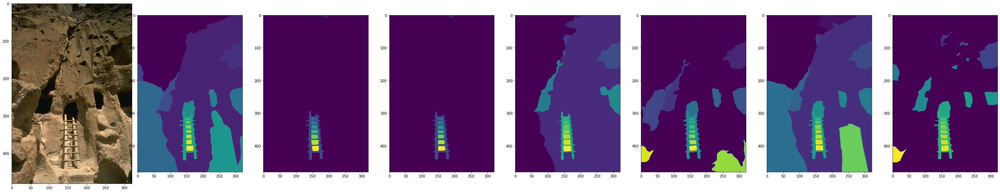

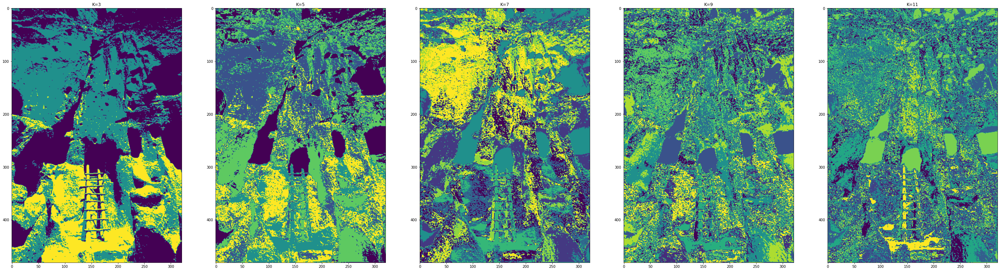

The Conditional Entropy for 3 clusters score is:
 0.9098576251042089
The F-Measure Score for  3  clusters is:
 0.1768835694069339
The Conditional Entropy for 5 clusters score is:
 0.8891458702795872
The F-Measure Score for  5  clusters is:
 0.1833666880395852
The Conditional Entropy for 7 clusters score is:
 0.8699915326660517
The F-Measure Score for  7  clusters is:
 0.15118425398799232
The Conditional Entropy for 9 clusters score is:
 0.8652134762489624
The F-Measure Score for  9  clusters is:
 0.10538144183003995
The Conditional Entropy for 11 clusters score is:
 0.7299697815306958
The F-Measure Score for  11  clusters is:
 0.09586077810376875
NUM=  7.0
NUM=  8.0
NUM=  9.0
NUM=  10.0
NUM=  11.0
NUM=  12.0
NUM=  13.0


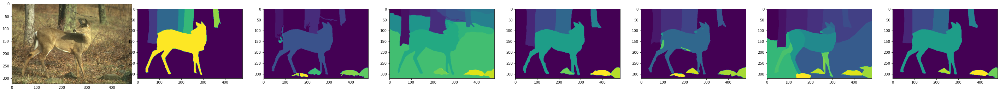

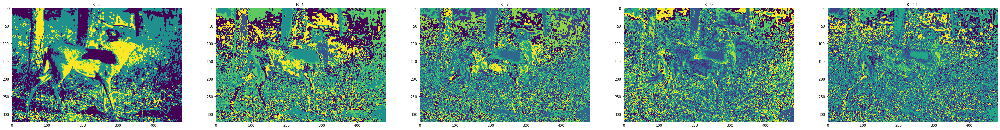

The Conditional Entropy for 3 clusters score is:
 0.9516636872505301
The F-Measure Score for  3  clusters is:
 0.2420968776108963
The Conditional Entropy for 5 clusters score is:
 0.9274956821187549
The F-Measure Score for  5  clusters is:
 0.32538001696880203
The Conditional Entropy for 7 clusters score is:
 0.9156485041512298
The F-Measure Score for  7  clusters is:
 0.01282375114150815
The Conditional Entropy for 9 clusters score is:
 0.9280567465534707
The F-Measure Score for  9  clusters is:
 0.16063367465236625
The Conditional Entropy for 11 clusters score is:
 0.921494686882163
The F-Measure Score for  11  clusters is:
 0.1293126339855312
NUM=  14.0
NUM=  15.0
NUM=  16.0
NUM=  17.0
NUM=  18.0
NUM=  19.0


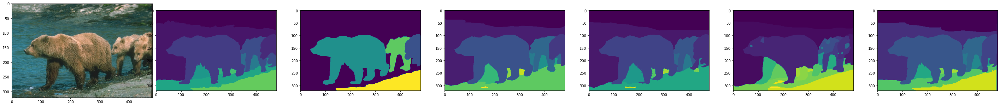

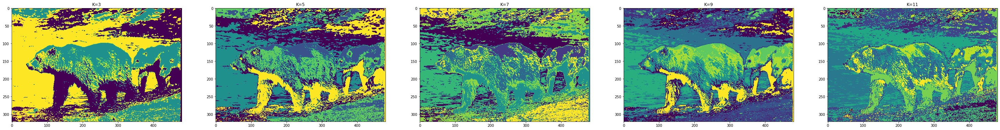

The Conditional Entropy for 3 clusters score is:
 0.8511222216448572
The F-Measure Score for  3  clusters is:
 0.09569886205400224
The Conditional Entropy for 5 clusters score is:
 0.7793848342911975
The F-Measure Score for  5  clusters is:
 0.2552379842099468
The Conditional Entropy for 7 clusters score is:
 0.7547735783970259
The F-Measure Score for  7  clusters is:
 0.10411201999987046
The Conditional Entropy for 9 clusters score is:
 0.6515516543553627
The F-Measure Score for  9  clusters is:
 0.09762242472522846
The Conditional Entropy for 11 clusters score is:
 0.6267123745089843
The F-Measure Score for  11  clusters is:
 0.08568597353644082
NUM=  18.0
NUM=  19.0
NUM=  20.0
NUM=  21.0
NUM=  22.0


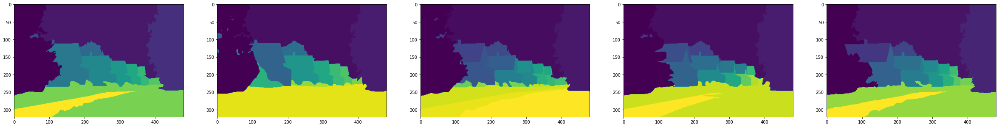

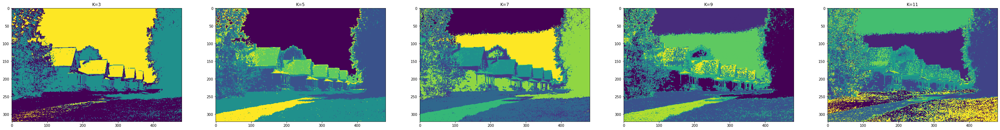

The Conditional Entropy for 3 clusters score is:
 0.6919313103595512
The F-Measure Score for  3  clusters is:
 0.06750603946865628
The Conditional Entropy for 5 clusters score is:
 0.6002831870363841
The F-Measure Score for  5  clusters is:
 0.014177369317556233
The Conditional Entropy for 7 clusters score is:
 0.5633877986778704
The F-Measure Score for  7  clusters is:
 0.007843213450690086
The Conditional Entropy for 9 clusters score is:
 0.5047148003783098
The F-Measure Score for  9  clusters is:
 0.2025440249739315
The Conditional Entropy for 11 clusters score is:
 0.4755546975641779
The F-Measure Score for  11  clusters is:
 0.2588001373048102
NUM=  20.0
NUM=  21.0
NUM=  22.0
NUM=  23.0
NUM=  24.0
NUM=  25.0


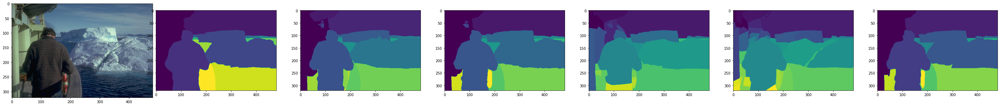

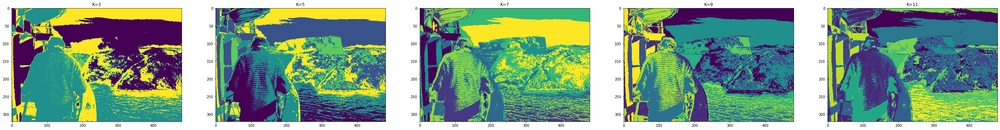

The Conditional Entropy for 3 clusters score is:
 0.7679325562891348
The F-Measure Score for  3  clusters is:
 0.08356811160549478
The Conditional Entropy for 5 clusters score is:
 0.7182094510027031
The F-Measure Score for  5  clusters is:
 0.02126929229732968
The Conditional Entropy for 7 clusters score is:
 0.6123364394979784
The F-Measure Score for  7  clusters is:
 0.06152809891127648
The Conditional Entropy for 9 clusters score is:
 0.6024683643999297
The F-Measure Score for  9  clusters is:
 0.020569814962338326
The Conditional Entropy for 11 clusters score is:
 0.5518090444216006
The F-Measure Score for  11  clusters is:
 0.004987014332808726


In [ ]:
path="/content/drive/MyDrive/BSR_Dataset/Images/data"
def Generate(path):
  train_imagesnumber=0
  train_grndtrurthnumber=0
  path_imagestrain=path+'/images/train'
  path_groundtruth=path+'/groundTruth/train'
 
  count=0
  mtrx_s=np.empty(0)
  mtrx_img=[[[]]]
  seg_number=np.zeros(5)
  for filename in glob.glob(path_imagestrain+"/*.jpg"):#looping through the file directory containing train images
    
    plt.figure(figsize=(50,50))
    imgvctr = imageio.imread(filename)
    
    
    
    x=np.array(imgvctr)    
    #print(Path(filename).stem) #The file number we need
    if (count==0): 
      img_1=x
    elif (count==1):
      img_2=x
    elif (count==2):
      img_3=x
    elif (count==3):
      img_4=x
    elif (count==4):
      img_5=x
    
    for grndmtrx in glob.glob(path_groundtruth+"/*.mat"):
      
      if (Path(grndmtrx).stem==Path(filename).stem):
        #grndtruth_images=np.((0,))
        mat_contents = scipy.io.loadmat(grndmtrx)
        #To access the groundTruth array or wtvr the fuck structure is that
        mtrx=mat_contents['groundTruth']
        #To access the Segmentation inside the groundTruth
        #-------------------
        mtrx_s=np.append(mtrx_s,mtrx[0])
        seg_number[count]=len(mtrx[0]) #number of segments in mtrx for one image
        mtrxlen=len(mtrx[0])
        plt.subplot(1,mtrxlen,1),plt.imshow(imgvctr)
        for i in range(mtrxlen):
          #mtrx_s[count*len(mtrx[0])+i] = mtrx[0][i][0][0][0]
          plt.subplot(1,mtrxlen+1,i+2),plt.imshow(mtrx[0][i][0][0][0])
         # print("NUM= ",i+seg_number[count-1]*count)
          sum=0
          for k in range(count):
            sum=sum+seg_number[k]
        #---------------------

        #Changing the second [] changes the lines in the picture like in the figures down
        #Changing the last [] by 0 is equivalent to typing ['Segmentation'] and ['1'] equivalent to ['Boundries'] which are lind like the pyramids in the pdf of the assignment
        mtrx_s1 = mtrx[0][1][0][0][0]
        mtrx_s2 = mtrx[0][2][0][0][0]
        mtrx_s3 = mtrx[0][3][0][0][0]
        mtrx_s4 = mtrx[0][4][0][0][0]
        mtrx_s5 = mtrx[0][4][0][0][0]
        #print(mtrx_s1)
       # plt.subplot(1,6,2),plt.imshow(mtrx_s1)
        
        #plt.subplot(1,6,3),plt.imshow(mtrx_s2)
       
        #plt.subplot(1,6,4),plt.imshow(mtrx_s3)
       # plt.subplot(1,6,5),plt.imshow(mtrx_s4)
        
       # plt.subplot(1,6,6),plt.imshow(mtrx_s5)
        plt.show()
        #print("Keys of .mat images:\n",mat_contents.keys())
        #print("Segmentation:\n",mtrx_s1)
        #print("Type of mtrx_s1",type(mtrx_s1))
        #print("Shape of mtrx_s1",mtrx_s1.shape)
        k=[3,5,7,9,11]
        rgb=returnrgb(imgvctr)
        #print(rgb)
        rgb_rows=np.size(rgb,0)
        num_rows = np.shape(imgvctr)[0]
        num_columns = np.shape(imgvctr)[1]
        labels=np.zeros((0,rgb_rows))
        plt.figure(figsize=(50,50))
        
        for i in range(len(k)):
          label = kmeans(rgb,k[i])
          #print(label)
          labels = np.append(labels,label, axis=0)
          #print(labels[0])
          segmented=labels[i].reshape(num_rows,num_columns)
          plt.subplot(1,len(k),i+1),plt.imshow(segmented)
          plt.title("K=%i"%k[i])
        plt.show()
        #print(labels[0])
        for i in range(len(k)):
          seg=mtrx[0][i][0][0][0].flatten()
          measure_entropy(seg,labels[i],k[i])
          measure_f(seg,labels[i],k[i])



      
#5osh ml mop
        if (count==4):
          return img_1,img_2,img_3,img_4,img_5,seg_number,mtrx_s   
          break
        count=count+1
    
img_1,img_2,img_3,img_4,img_5,seg_number,mtrx_s = Generate(path)

# PART4:

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


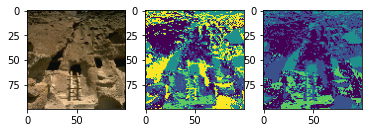

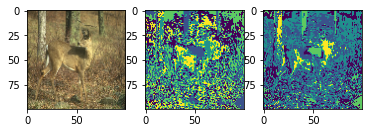

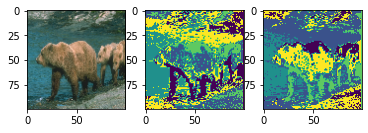

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


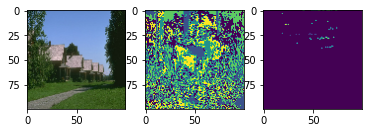

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


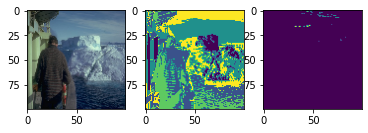

In [ ]:

img_1s=cv2.resize(img_1, (100,100))
img_2s=cv2.resize(img_2, (100,100))
img_3s=cv2.resize(img_3, (100,100))
img_4s=cv2.resize(img_4, (100,100))
img_5s=cv2.resize(img_5, (100,100))

#get rgb arranged images for each of the five images
rgb_1=returnrgb(img_1s)
rgb_2=returnrgb(img_2s)
rgb_3=returnrgb(img_3s)
rgb_4=returnrgb(img_4s)
rgb_5=returnrgb(img_5s)

#kmeans for each image
#plt.figure(figsize=(50,50))
#1--------------
label1=kmeans(rgb_1,5)
label1=label1.reshape(100,100)
lable1_n=N_cut(rgb_1).reshape(100,100)
plt.subplot(1,3,1),plt.imshow(img_1s)
plt.subplot(1,3,2),plt.imshow(label1)
plt.subplot(1,3,3),plt.imshow(lable1_n)
plt.show()
#2--------------
label2=kmeans(rgb_2,5)
label2=label2.reshape(100,100)
label2_n=N_cut(rgb_2).reshape(100,100)
plt.subplot(1,3,1),plt.imshow(img_2s)
plt.subplot(1,3,2),plt.imshow(label2)
plt.subplot(1,3,3),plt.imshow(label2_n)
plt.show()
#3-------------
label3=kmeans(rgb_3,5)
label3=label3.reshape(100,100)
label3_n=N_cut(rgb_3).reshape(100,100)

plt.subplot(1,3,1),plt.imshow(img_3s)
plt.subplot(1,3,2),plt.imshow(label3)
plt.subplot(1,3,3),plt.imshow(label3_n)
plt.show()
#4--------------------
label4=kmeans(rgb_2,5)
label4=label4.reshape(100,100)
label4_n=N_cut(rgb_4).reshape(100,100)
plt.subplot(1,3,1),plt.imshow(img_4s)
plt.subplot(1,3,2),plt.imshow(label4)
plt.subplot(1,3,3),plt.imshow(label4_n)
plt.show()
#5--------------------
label5=kmeans(rgb_5,5)
label5=label5.reshape(100,100)
label5_n=N_cut(rgb_5).reshape(100,100)
plt.subplot(1,3,1),plt.imshow(img_5s)
plt.subplot(1,3,2),plt.imshow(label5)
plt.subplot(1,3,3),plt.imshow(label5_n)
plt.show()

#kmeans(rgb_3,5)
#kmeans(rgb_4,5)
#kmeans(rgb_5,5)



# BONUS

In [ ]:
print(rgb_1.shape)
num_rows = np.shape(imgvctr)[0]
num_columns = np.shape(imgvctr)[1]
coordinates=np.zeros((num_columns*num_rows,2))
for i in range(num_rows):
  for j in range(num_columns):
    coordinates[(i*num_columns)+j][0]=i
    coordinates[(i*num_columns)+j][1]=j

print(coordinates)

rgbxy=np.append(coordinates,rgb,axis=1)

In [ ]:
k=[3,5,7,9,11]

for i in k:
  kmeans = KMeans(n_clusters=3, random_state=0).fit(rgbxy)
  label=kmeans.labels_
  u_labels = np.unique(label)
  #print(u_labels)
  #print(label) 
  
  #filtered_label.append(D[label ==j])
  #filtered_label8 = D[label == 0]
  fig2 = plt.figure()
  ax = Axes3D(fig2)
  for j in u_labels:
    ax.scatter(rgbxy[label == j , 0] , rgbxy[label == j , 1] , rgbxy[label == j,2],label = j)
  plt.title("K=%i"%i)
  plt.show()
  
  if(i==3):
    break